<a href="https://colab.research.google.com/github/Mohammad-Fleity2002/Brain_Tumor_Classification/blob/main/Brain_Tumor_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import math
import time
import imutils

from PIL import Image
import random
import pandas as pd
import numpy as np
import cv2
import os, shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
%matplotlib inline
plt.style.use('ggplot')
from sklearn.utils import shuffle
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


import tensorflow as tf
from tensorflow.keras.optimizers.schedules import ExponentialDecay
from tensorflow.keras.layers import (RandomFlip, RandomRotation, Rescaling,
                        RandomZoom, Resizing, RandomBrightness, RandomContrast)
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten,Dense ,Dropout
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D,
                                     BatchNormalization, Flatten, Dense, Dropout)

In [ ]:
import pickle
from tensorflow.keras.layers import Input
from tensorflow.keras.models import load_model

# Functions

In [ ]:
def timing(sec_elapsed):
    ''' Timing function '''
    h=int(sec_elapsed/(60*60))
    m=int(sec_elapsed%(60*60)/60)
    s=sec_elapsed%60
    return f"{h}:{m}:{s}"

In [ ]:
def load_history(filepath):
    with open(filepath, "rb") as file:
        return pickle.load(file)

# # Load saved histories
# history_01 = load_history("/content/drive/MyDrive/Brain Tumor/histories/history_01.pkl")
# history_02 = load_history("/content/drive/MyDrive/Brain Tumor/histories/history_02.pkl")
# history3 = load_history("/content/drive/MyDrive/Brain Tumor/histories/history3.pkl")

# print("Histories loaded successfully.")

In [ ]:
def augmented_data(file_dir,n_generated_samples, save_to_dir):
    ''' Data augmentation function and saving to save_to_dir '''
    data_gen=ImageDataGenerator(rotation_range=10,
                      width_shift_range=0.1,
                      height_shift_range=0.1,
                      shear_range=0.1,
                      brightness_range=(0.3,1.0),
                      horizontal_flip=True,
    vertical_flip=True,
                     )
    # ImageDataGenertor(rotation_ranges=10,width_shift_range=0.1,height_shift_range=0.1)
    for filename in os.listdir(file_dir):
        image=cv2.imread(file_dir+'/'+filename)
        image=image.reshape((1,)+image.shape)
        save_prefix='aug_'+filename[:-4]
        i=0
        for batch in data_gen.flow(x=image,batch_size=1,save_to_dir=save_to_dir,save_prefix=save_prefix,save_format="jpg"):
            i+=1
            if i>n_generated_samples:
                break

In [ ]:
def delete_folder(folder_path):
    ''' Example usage: delete_folder('augmented_data/N/')  '''
    try:
        shutil.rmtree(folder_path)
        print(f"Folder '{folder_path}' and all its contents have been deleted.")
    except Exception as e:
        print(f"Error: {e}")


In [ ]:
def data_summary(main_path):
    ''' This function list each data class and it's percentage from the total dataset '''
    nb_P=len(os.listdir(r""+main_path+"P"))
    nb_G=len(os.listdir(r""+main_path+"G"))
    nb_M=len(os.listdir(r""+main_path+"M"))
    nb_N=len(os.listdir(r""+main_path+"N"))

    n=(nb_P+nb_G+nb_M+nb_N)


    P_per=(nb_P*100)/n
    G_per=(nb_G*100)/n
    M_per=(nb_M*100)/n
    N_per=(nb_N*100)/n

    print(f"Number of samples: {n}.")
    print(f"Number of Pituitary samples: {nb_P} = {round(P_per,2)}%.")
    print(f"Number of Normal samples: {nb_N} = {round(N_per,2)}%.")
    print(f"Number of Giloma samples: {nb_G} = {round(G_per,2)}%.")
    print(f"Number of Meningioma samples: {nb_M} = {round(M_per,2)}%.")

In [ ]:
def crop_brain_Tumor(image,plot=False):
    ''' This Function cut the outer black spaces so the image frame fit the outer (largest) brain boundary. '''
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply binary threshold
    threshold = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
    threshold = cv2.erode(threshold, None, iterations=2)
    threshold = cv2.dilate(threshold, None, iterations=2)

    # Find contours
    contours = cv2.findContours(threshold.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    c = max(contours, key=cv2.contourArea)

    # Get bounding box coordinates
    left = tuple(c[c[:, :, 0].argmin()][0])
    right = tuple(c[c[:, :, 0].argmax()][0])
    top = tuple(c[c[:, :, 1].argmin()][0])
    bot = tuple(c[c[:, :, 1].argmax()][0])

    # Crop the image
    new_image = image[top[1]:bot[1], left[0]:right[0]]

    # Plotting if requested
    if plot:
        plt.figure()
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image')
        plt.axis('off')
        plt.show()

    return new_image

In [ ]:
def load_data(dir_list, image_size):
    ''' LABEL THE DATASET ['P', 'N', 'G', 'M'] [0, 1, 2,3]  '''
    x = []
    y = []
    image_width, image_height = image_size

    # Define the class labels
    class_labels = ['P', 'N', 'G', 'M']

    for directory in dir_list:
      print(directory)
      class_name = directory.split('/')[6]  # Extract class name from the folder name
      print(class_name)
      if class_name not in class_labels:            continue  # Skip if the class is not in the defined labels

      class_index = class_labels.index(class_name)  # Assign the corresponding class index
      for filename in os.listdir(directory):
          # print(filename)
          if filename[:3] != "aug":  # Skip augmented images
              continue
          img = cv2.imread(os.path.join(directory, filename))
          img = crop_brain_Tumor(img, plot=False)
          img = cv2.resize(img, dsize=(image_width, image_height), interpolation=cv2.INTER_CUBIC)
          img = img / 255.00
          x.append(img)
          y.append(class_index)  # Assign class index (0, 1, 2, or 3)

    x = np.array(x)
    y = np.array(y)

    # Shuffle the data
    x, y = shuffle(x, y)

    print(f"Number of examples: {len(x)}")
    print(f"x SHAPE: {x.shape}")
    print(f"y SHAPE: {y.shape}")

    return x, y


In [ ]:
def plot_sample_images(x, y, n=50):
    ''' PLOT 50 by default image samples of preprocessed data for each class P, M, G, N '''
    for label in [0,1,2,3]:
        images = x[np.argwhere(y == label)]
        n_images = images[:n]

        columns_n = 10
        rows_n = int(n/ columns_n)

        plt.figure(figsize=(20, 10))

        i = 1
        for image in n_images:
            plt.subplot(rows_n, columns_n, i)
            plt.imshow(image[0])

            plt.tick_params(axis='both', which='both',
                            top=False, bottom=False, left=False, right=False,
                            labelbottom=False, labeltop=False, labelleft=False,
                            labelright=False)

            i += 1
        # 0=P 1=N 2=G 3=M
        # label_to_str = lambda label: "P" if label == 1 else "No"
        label_to_str = lambda label: "P" if label == 0 else ("N" if label == 1 else ("G" if label == 2 else "M"))
        plt.suptitle(f"Brain Tumor: {label_to_str(label)}")
        plt.show()


In [ ]:
def delete_files_starting_with(folder_path, prefix="Gaug"):
    """
    Deletes all files in the specified folder that start with the given prefix.

    Parameters:
        folder_path (str): The path to the folder.
        prefix (str): The prefix to match file names (default is 'Gaug').

    Example usage:
        delete_files_starting_with("./augmented_data", prefix="Gaug")
    """
    if not os.path.exists(folder_path):
        print(f"Folder does not exist: {folder_path}")
        return

    files_deleted = 0
    for file_name in os.listdir(folder_path):
        if file_name.startswith(prefix):
            file_path = os.path.join(folder_path, file_name)
            try:
                os.remove(file_path)
                files_deleted += 1
            except Exception as e:
                print(f"Error deleting file {file_path}: {e}")

    print(f"Deleted {files_deleted} files starting with '{prefix}' in folder: {folder_path}")



In [ ]:
def remove_ipynb_checkpoints(base_dir):
    '''
    Example usage:
        remove_ipynb_checkpoints('/content/augmented_data')
    '''
    for root, dirs, files in os.walk(base_dir):
        for dir_name in dirs:
            if dir_name == '.ipynb_checkpoints':
                shutil.rmtree(os.path.join(root, dir_name))
                print(f"Removed: {os.path.join(root, dir_name)}")



In [ ]:
def count_images_in_directory(directory):
    """
    Count the number of images in each class within a given directory.
    Example usage:
        train_counts = count_images_in_directory(r'/content/drive/MyDrive/Brain Tumor/Dataset/train')
    """
    counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory
            counts[class_name] = len(os.listdir(class_path))  # Count files
    return counts


In [ ]:
def show_samples(data_dir, class_names, num_samples=3):
    """
    Display a random sample of images from each class.

    Parameters:
    - data_dir: The base directory containing subfolders for each class.
    - class_names: List of class names (subfolders in the data_dir).
    - num_samples: Number of random samples to display from each class.
     Example usage:
         show_samples(r'/content/drive/MyDrive/Brain Tumor/Dataset/train', class_names, num_samples=3)
    """
    fig, axes = plt.subplots(len(class_names), num_samples, figsize=(num_samples * 3, len(class_names) * 3))

    for i, class_name in enumerate(class_names):
        class_path = os.path.join(data_dir, class_name)
        images = os.listdir(class_path)

        # Randomly select images from the class folder
        selected_images = random.sample(images, num_samples)

        for j, img_name in enumerate(selected_images):
            img_path = os.path.join(class_path, img_name)
            img = Image.open(img_path)
            axes[i, j].imshow(img)
            axes[i, j].axis('off')  # Hide axis

            # Set the title above each image
            axes[i, j].set_title(class_name, fontsize=10, pad=10)

    plt.tight_layout()
    plt.show()

In [ ]:
def learning_curves_plot(tr_data, start_epoch):
    """
    Plot the training and validation data
    Example usage:
        learning_curves_plot(history, start_epoch=0)
    """
    tacc = tr_data.history['accuracy']
    tloss = tr_data.history['loss']
    vacc = tr_data.history['val_accuracy']
    vloss = tr_data.history['val_loss']
    Epoch_count = len(tacc) + start_epoch
    Epochs = []
    for i in range(start_epoch, Epoch_count):
        Epochs.append(i + 1)
    index_loss = np.argmin(vloss)  # this is the epoch with the lowest validation loss
    val_lowest = vloss[index_loss]
    index_acc = np.argmax(vacc)
    acc_highest = vacc[index_acc]
    plt.style.use('fivethirtyeight')
    sc_label = 'best epoch= ' + str(index_loss + 1 + start_epoch)
    vc_label = 'best epoch= ' + str(index_acc + 1 + start_epoch)
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))
    axes[0].plot(Epochs, tloss, 'r', label='Training loss')
    axes[0].plot(Epochs, vloss, 'g', label='Validation loss')
    axes[0].scatter(index_loss + 1 + start_epoch, val_lowest, s=150, c='blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot(Epochs, tacc, 'r', label='Training Accuracy')
    axes[1].plot(Epochs, vacc, 'g', label='Validation Accuracy')
    axes[1].scatter(index_acc + 1 + start_epoch, acc_highest, s=150, c='blue', label=vc_label)
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()
    plt.tight_layout
    plt.show()

In [ ]:
def data_augmenter():
    '''
    Create a Sequential model composed of multiple layers
    Returns:
        tf.keras.Sequential
    '''
    data_augmentation = tf.keras.Sequential()
    data_augmentation.add(RandomFlip("horizontal", seed=42)),
    data_augmentation.add(RandomRotation(0.1, seed=42, fill_mode="nearest")),
    data_augmentation.add(RandomBrightness(0.1, seed=42)),
    data_augmentation.add(RandomContrast(0.1, seed=42)),
    data_augmentation.add(RandomZoom(0.1, fill_mode="nearest", seed=42)),

    return data_augmentation

In [ ]:
def nasnet_model(data_augmentation=data_augmenter()):
    ''' Define a tf.keras model for multiclass classification out of the NasNetMobile model
    Arguments:
    Returns:
        tf.keras.model
    Example usage:
        nasnet = nasnet_model(data_augmenter())
    '''

    base_model = tf.keras.applications.NASNetMobile(input_shape=(224,224,3),
                                                        include_top= False, # <== Important!!!!
                                                        weights='imagenet') # From imageNet

    # freeze the base model by making it non trainable
    base_model.trainable = False

    # create the input layer (Same as the imageNetv3Large input size)
    inputs = tf.keras.Input(shape=(224, 224, 3))

    x = data_augmenter()(inputs)
    # data preprocessing using the same weights the model was trained on
    x = preprocess_input(x)

    # set training to False to avoid keeping track of statistics in the batch norm layer
    x = base_model(x, training=False)

    # add the new Binary classification layers
    # use global avg pooling to summarize the info in each channel
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)
    x = Dense(128, activation = 'relu')(x)
    x = Dropout(0.4)(x)

    # use a prediction layer with one neuron (as a binary classifier only needs one)
    outputs = Dense(4, activation = 'softmax')(x)

    model = tf.keras.Model(inputs, outputs)

    return model

In [ ]:
def learning_curves_tuning(tr_data, start_epoch, history_fine=None, fine_tune_epoch=None):
    """
    Get training and validation data from initial training

    """
    tacc = tr_data.history['accuracy'][:]
    tloss = tr_data.history['loss'][:]
    vacc = tr_data.history['val_accuracy'][:]
    vloss = tr_data.history['val_loss'][:]

    # Ensure the lengths of training data and epochs match
    train_epochs_count = len(tacc) + start_epoch  # or len(vloss), should be the same
    train_epochs = list(range(1, train_epochs_count + 1))

    # If fine-tuning data exists, concatenate it
    if history_fine:
        tacc += history_fine.history['accuracy']
        tloss += history_fine.history['loss']
        vacc += history_fine.history['val_accuracy']
        vloss += history_fine.history['val_loss']

    # Ensure the total epoch count matches the combined data
    total_epochs_count = len(tacc)  # Now the length should match tloss or vloss
    total_epochs = list(range(1, total_epochs_count + 1))

    # Find best epoch based on validation loss and accuracy
    index_loss = np.argmin(vloss)  # epoch with the lowest validation loss
    val_lowest = vloss[index_loss]
    index_acc = np.argmax(vacc)  # epoch with the highest validation accuracy
    acc_highest = vacc[index_acc]

    # Define plot labels
    sc_label = 'best epoch= ' + str(index_loss + 1 + start_epoch)
    vc_label = 'best epoch= ' + str(index_acc + 1 + start_epoch)

    plt.style.use('fivethirtyeight')
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 8))

    # Plot loss curves
    axes[0].plot(total_epochs, tloss, 'r', label='Training Loss')
    axes[0].plot(total_epochs, vloss, 'g', label='Validation Loss')
    axes[0].scatter(index_loss + 1 + start_epoch, val_lowest, s=150, c='blue', label=sc_label)

    # Add fine-tuning marker
    if fine_tune_epoch:
        axes[0].axvline(x=fine_tune_epoch, color='orange', linestyle='--', label='Start Fine Tuning')

    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # Plot accuracy curves
    axes[1].plot(total_epochs, tacc, 'r', label='Training Accuracy')
    axes[1].plot(total_epochs, vacc, 'g', label='Validation Accuracy')
    axes[1].scatter(index_acc + 1 + start_epoch, acc_highest, s=150, c='blue', label=vc_label)

    # Add fine-tuning marker
    if fine_tune_epoch:
        axes[1].axvline(x=fine_tune_epoch, color='orange', linestyle='--', label='Start Fine Tuning')

    axes[1].set_title('Training and Validation Accuracy')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# setting up dataset

In [ ]:
# delete_folder(r'/content/drive/MyDrive/Brain Tumor/Data')

Folder '/content/drive/MyDrive/Brain Tumor/Data' and all its contents have been deleted.


In [ ]:
# Dataset
import zipfile
zip_path = "/content/drive/MyDrive/Brain Tumor/archive.zip"
extract_path = "/content/drive/MyDrive/Brain Tumor/"

with zipfile.ZipFile(zip_path, 'r') as z:
    z.extractall(extract_path)
    print(z)

# print("Extraction completed successfully.")

<zipfile.ZipFile filename='/content/drive/MyDrive/Brain Tumor/archive.zip' mode='r'>


In [ ]:
# GLOBAL VARIABLE
folder_glioma=r'/content/drive/MyDrive/Brain Tumor/Data/glioma_tumor/'
folder_normal=r'/content/drive/MyDrive/Brain Tumor/Data/normal/'
folder_meningioma=r'/content/drive/MyDrive/Brain Tumor/Data/meningioma_tumor/'
folder_pituitary=r'/content/drive/MyDrive/Brain Tumor/Data/pituitary_tumor/'


In [ ]:
# folder_glioma=r'./Data/glioma_tumor/'
count=1
for filename in os.listdir(folder_glioma):
    source=folder_glioma+filename
    destination=folder_glioma+"G_"+str(count)+".jpg"
    os.rename(source,destination)
    count+=1
print("All files are renamed.")

# folder_normal=r'./Data/normal/'
count=1
for filename in os.listdir(folder_normal):
    source=folder_normal+filename
    destination=folder_normal+"N_"+str(count)+".jpg"
    os.rename(source,destination)
    count+=1
print("All files are renamed.")

# folder_meningioma=r'./Data/meningioma_tumor/'
count=1
for filename in os.listdir(folder_meningioma):
    source=folder_meningioma+filename
    destination=folder_meningioma+"M_"+str(count)+".jpg"
    os.rename(source,destination)
    count+=1
print("All files are renamed.")

# folder_pituitary=r'./Data/pituitary_tumor/'
count=1
for filename in os.listdir(folder_pituitary):
    source=folder_pituitary+filename
    destination=folder_pituitary+"P_"+str(count)+".jpg"
    os.rename(source,destination)
    count+=1
print("All files are renamed.")

All files are renamed.
All files are renamed.
All files are renamed.
All files are renamed.


# EDA(exploratory Data Analysis)

In [ ]:
# GLOBAL VARIABLES
list_M=os.listdir(folder_meningioma)
list_P=os.listdir(folder_pituitary)
list_G=os.listdir(folder_glioma)
list_N=os.listdir(folder_normal)
print("Miningioma:",len(list_M),".\nPituitary:",len(list_P),".\nNormal:",len(list_N),".\nGlioma:",len(list_G),".")

Miningioma: 454 .
Pituitary: 417 .
Normal: 224 .
Glioma: 446 .


<function matplotlib.pyplot.show(close=None, block=None)>

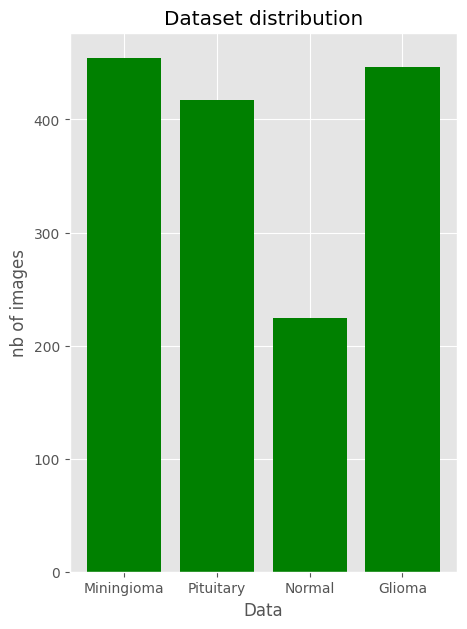

In [ ]:
data={'Miningioma':len(list_M),'Pituitary':len(list_P),'Normal':len(list_N),'Glioma':len(list_G)}
typex=data.keys()
# print(typex)
values=data.values()
# print(values)
fig=plt.figure(figsize=(5,7))
plt.bar(typex,values,color="green")
plt.xlabel("Data")
plt.ylabel("nb of images")
plt.title("Dataset distribution")
plt.show

# data augmentation

<h1 style="color: red"> Create the augmented data folder</h1>

In [ ]:
# GLOBAL VARIABLE
augmented_data_path = '/content/drive/MyDrive/Brain Tumor/augmented_data/'

In [ ]:
start_time = time.time()


# augmented_data_path = 'augmented_data/'

augmented_data(file_dir = folder_glioma, n_generated_samples=0, save_to_dir=augmented_data_path+'G')
augmented_data(file_dir = folder_meningioma, n_generated_samples=0, save_to_dir=augmented_data_path+'M')
augmented_data(file_dir = folder_normal, n_generated_samples=1, save_to_dir=augmented_data_path+'N')
augmented_data(file_dir = folder_pituitary, n_generated_samples=0, save_to_dir=augmented_data_path+'P')

end_time = time.time()
execution_time = end_time - start_time
print(timing(execution_time))

0:1:6.376347780227661


In [ ]:
data_summary(augmented_data_path)

Number of samples: 1765.
Number of Pituitary samples: 417 = 23.63%.
Number of Normal samples: 448 = 25.38%.
Number of Giloma samples: 446 = 25.27%.
Number of Meningioma samples: 454 = 25.72%.


In [ ]:
# GLOBAL VARIABLE
aug_folder_meningioma=r'/content/drive/MyDrive/Brain Tumor/augmented_data/M'
aug_folder_pituitary=r'/content/drive/MyDrive/Brain Tumor/augmented_data/P'
aug_folder_glioma=r'/content/drive/MyDrive/Brain Tumor/augmented_data/G'
aug_folder_normal=r'/content/drive/MyDrive/Brain Tumor/augmented_data/N'


list_M=os.listdir(aug_folder_meningioma)
list_P=os.listdir(aug_folder_pituitary)
list_G=os.listdir(aug_folder_glioma)
list_N=os.listdir(aug_folder_normal)


<function matplotlib.pyplot.show(close=None, block=None)>

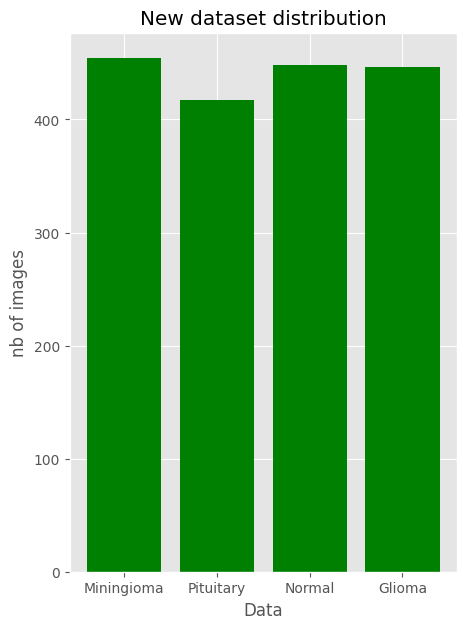

In [ ]:
data={'Miningioma':len(list_M),'Pituitary':len(list_P),'Normal':len(list_N),'Glioma':len(list_G)}
typex=data.keys()
values=data.values()
fig=plt.figure(figsize=(5,7))
plt.bar(typex,values,color="green")
plt.xlabel("Data")
plt.ylabel("nb of images")
plt.title("New dataset distribution")
plt.show

# Data preprocessing

### watch out for img paths

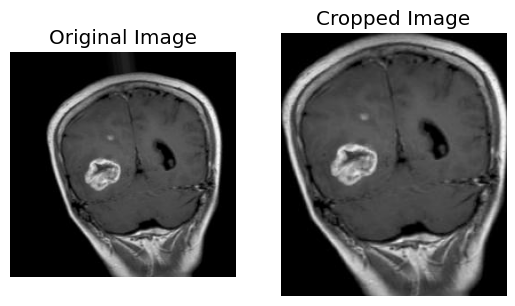

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
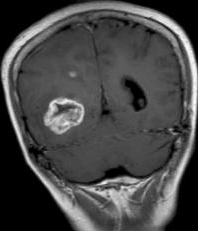

In [ ]:
img=cv2.imread("/content/drive/MyDrive/Brain Tumor/augmented_data/G/aug_G_106_0_8708.jpg")
crop_brain_Tumor(img,True)

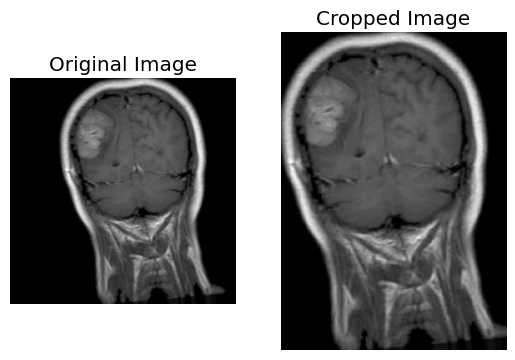

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)
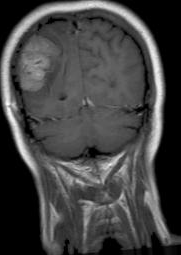

In [ ]:
img=cv2.imread("/content/drive/MyDrive/Brain Tumor/augmented_data/M/aug_M_102_0_8088.jpg")
crop_brain_Tumor(img,True)

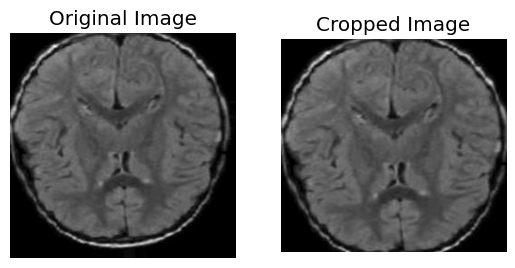

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)
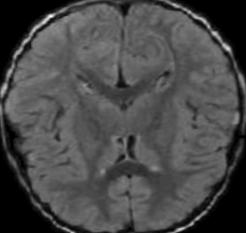

In [ ]:
img=cv2.imread("/content/drive/MyDrive/Brain Tumor/augmented_data/N/aug_N_102_0_4796.jpg")
crop_brain_Tumor(img,True)

## LABELING THE DATA

In [ ]:
start_time = time.time()

dir_list = [aug_folder_pituitary+"/", aug_folder_normal+"/", aug_folder_glioma+"/", aug_folder_meningioma+"/"]
IMAGE_WIDTH,IMAGE_HEIGHT=(240,240)

x,y=load_data(dir_list,(IMAGE_WIDTH,IMAGE_HEIGHT))

end_time = time.time()
execution_time = end_time - start_time
print(timing(execution_time))
# print(len(x))

/content/drive/MyDrive/Brain Tumor/augmented_data/P/
P
/content/drive/MyDrive/Brain Tumor/augmented_data/N/
N
/content/drive/MyDrive/Brain Tumor/augmented_data/G/
G
/content/drive/MyDrive/Brain Tumor/augmented_data/M/
M
Number of examples: 1765
x SHAPE: (1765, 240, 240, 3)
y SHAPE: (1765,)
0:0:26.802096605300903


### Plotting a sample of 50 images.

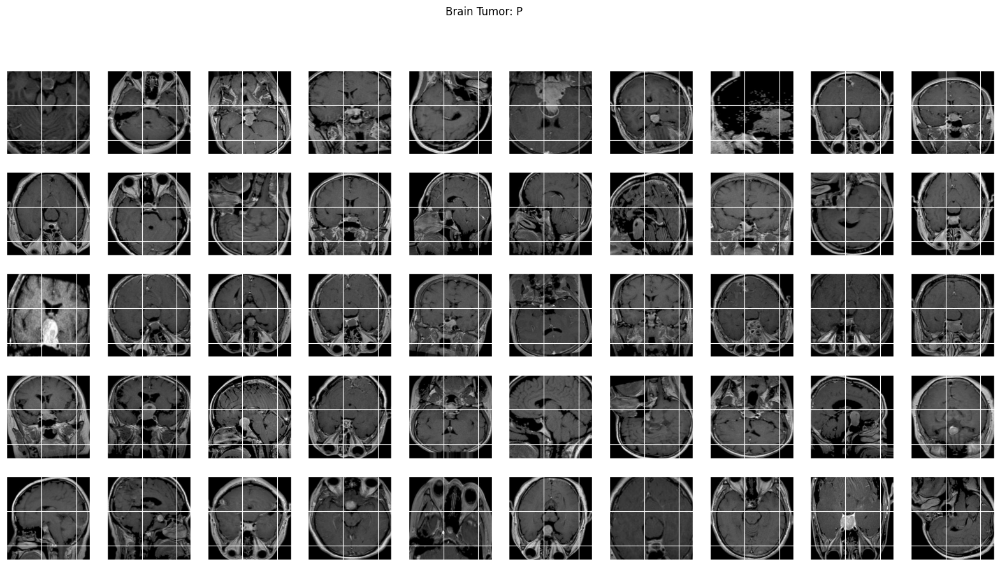

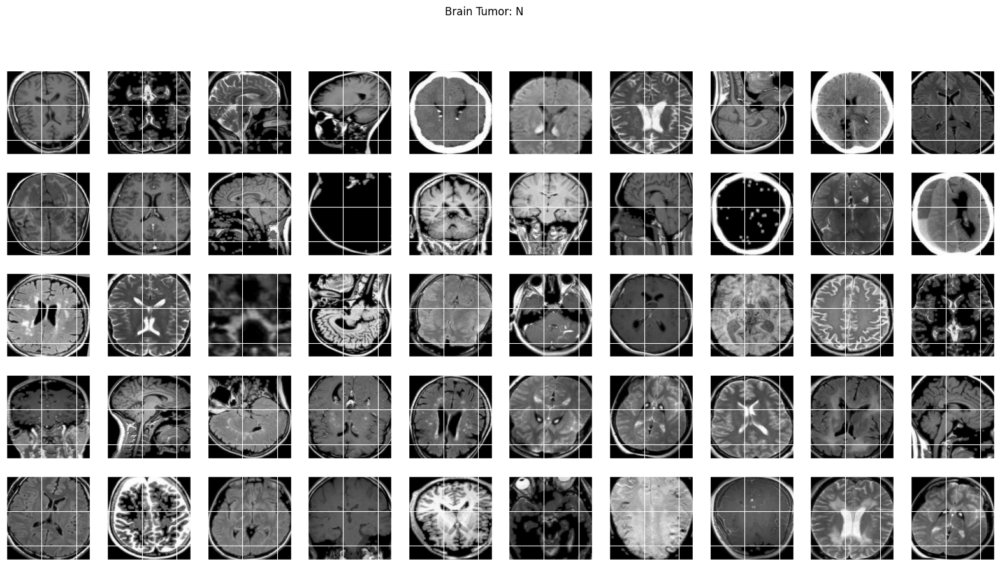

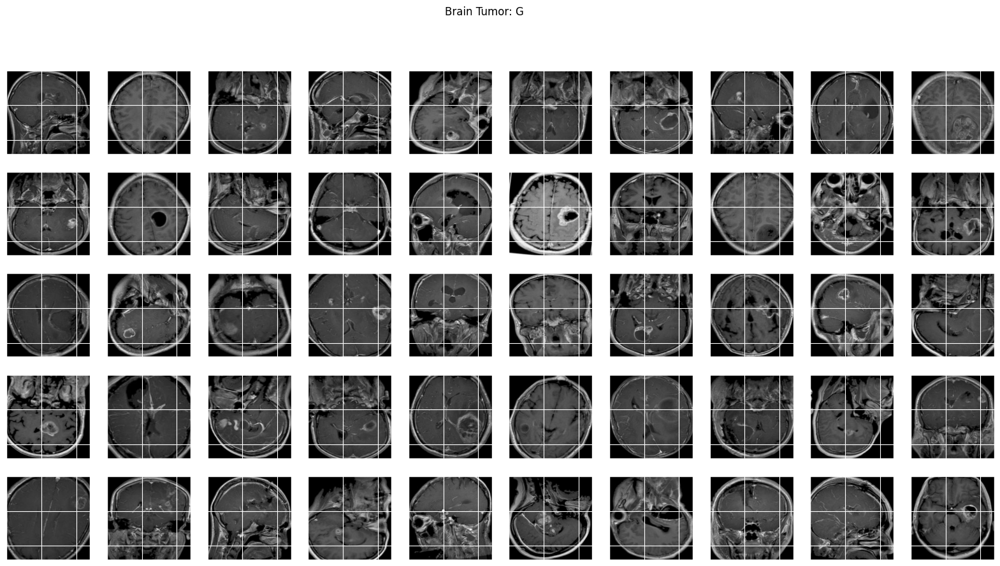

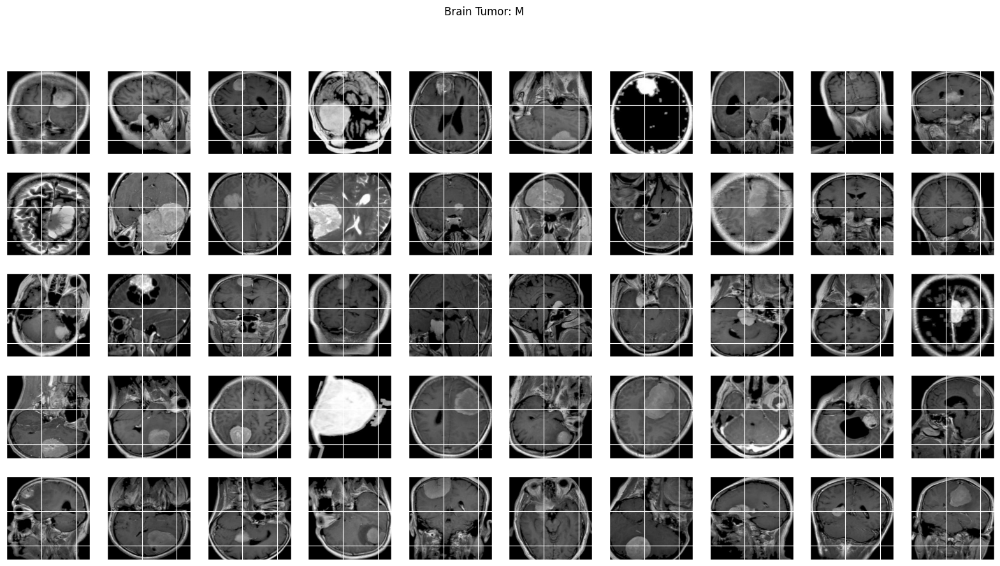

In [ ]:
plot_sample_images(x,y)

## CROPPING IMAGES

In [ ]:
for filename in os.listdir(aug_folder_glioma):
    img = cv2.imread(aug_folder_glioma + "/"+filename)
    # print(aug_folder_glioma +"/" +filename)
    img = crop_brain_Tumor(img, False)
    cv2.imwrite(aug_folder_glioma + "/"+ filename, img)

for filename in os.listdir(aug_folder_meningioma):
    img = cv2.imread(aug_folder_meningioma + "/"+ filename)
    img = crop_brain_Tumor(img, False)
    cv2.imwrite(aug_folder_meningioma + "/"+ filename, img)

for filename in os.listdir(aug_folder_normal):
    img = cv2.imread(aug_folder_normal + "/"+ filename)
    img = crop_brain_Tumor(img, False)
    cv2.imwrite(aug_folder_normal + "/"+ filename, img)

for filename in os.listdir(aug_folder_pituitary):
    img = cv2.imread(aug_folder_pituitary + "/"+ filename)
    img = crop_brain_Tumor(img, False)
    cv2.imwrite(aug_folder_pituitary + "/"+ filename, img)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Dataset'):
    Base_directory=r'/content/drive/MyDrive/Brain Tumor/Dataset'
    os.mkdir(Base_directory)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Dataset/train'):
    train_dir = os.path.join(Base_directory , 'train')
    os.mkdir(train_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Dataset/test'):
    test_dir = os.path.join(Base_directory , 'test')
    os.mkdir(test_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Dataset/valid'):
    valid_dir = os.path.join(Base_directory , 'valid')
    os.mkdir(valid_dir)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/train/G'):
    infected_train_dir = os.path.join(train_dir, 'G')
    os.mkdir(infected_train_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/test/G'):
    infected_test_dir = os.path.join(test_dir, 'G')
    os.mkdir(infected_test_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/valid/G'):
    infected_valid_dir = os.path.join(valid_dir, 'G')
    os.mkdir(infected_valid_dir)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/train/P'):
    infected_train_dir = os.path.join(train_dir, 'P')
    os.mkdir(infected_train_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/test/P'):
    infected_test_dir = os.path.join(test_dir, 'P')
    os.mkdir(infected_test_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/valid/P'):
    infected_valid_dir = os.path.join(valid_dir, 'P')
    os.mkdir(infected_valid_dir)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/train/N'):
    infected_train_dir = os.path.join(train_dir, 'N')
    os.mkdir(infected_train_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/test/N'):
    infected_test_dir = os.path.join(test_dir, 'N')
    os.mkdir(infected_test_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/valid/N'):
    infected_valid_dir = os.path.join(valid_dir, 'N')
    os.mkdir(infected_valid_dir)

In [ ]:
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/train/M'):
    infected_train_dir = os.path.join(train_dir, 'M')
    os.mkdir(infected_train_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/test/M'):
    infected_test_dir = os.path.join(test_dir, 'M')
    os.mkdir(infected_test_dir)
if not os.path.isdir(r'/content/drive/MyDrive/Brain Tumor/Datasest/valid/M'):
    infected_valid_dir = os.path.join(valid_dir, 'M')
    os.mkdir(infected_valid_dir)

In [ ]:
print(aug_folder_glioma)
print(aug_folder_meningioma)
print(aug_folder_normal)
print(aug_folder_pituitary)

/content/drive/MyDrive/Brain Tumor/augmented_data/G
/content/drive/MyDrive/Brain Tumor/augmented_data/M
/content/drive/MyDrive/Brain Tumor/augmented_data/N
/content/drive/MyDrive/Brain Tumor/augmented_data/P


In [ ]:
# GLOBAL VARIABLE
p=len(os.listdir(aug_folder_pituitary))
n=len(os.listdir(aug_folder_normal))
g=len(os.listdir(aug_folder_glioma))
m=len(os.listdir(aug_folder_meningioma))


D_G_test=r'/content/drive/MyDrive/Brain Tumor/Dataset/test/G'
D_M_test=r'/content/drive/MyDrive/Brain Tumor/Dataset/test/M'
D_N_test=r'/content/drive/MyDrive/Brain Tumor/Dataset/test/N'
D_P_test=r'/content/drive/MyDrive/Brain Tumor/Dataset/test/P'

D_G_train=r'/content/drive/MyDrive/Brain Tumor/Dataset/train/G'
D_M_train=r'/content/drive/MyDrive/Brain Tumor/Dataset/train/M'
D_N_train=r'/content/drive/MyDrive/Brain Tumor/Dataset/train/N'
D_P_train=r'/content/drive/MyDrive/Brain Tumor/Dataset/train/P'

D_G_valid=r'/content/drive/MyDrive/Brain Tumor/Dataset/valid/G'
D_M_valid=r'/content/drive/MyDrive/Brain Tumor/Dataset/valid/M'
D_P_valid=r'/content/drive/MyDrive/Brain Tumor/Dataset/valid/P'
D_N_valid=r'/content/drive/MyDrive/Brain Tumor/Dataset/valid/N'



In [ ]:
print(os.path.isdir(D_G_test))
print(os.path.isdir(D_M_test))
print(os.path.isdir(D_N_test))
print(os.path.isdir(D_P_test))

print("pituarity:",p,"sample.\n70% for training:",round(p*0.7),".\n15% for testing:",round(p*0.15),".\n15% for validation:",round(p*0.15),".")
print("glioma:",g,"sample.\n70% for training:",round(g*0.7),".\n15% for testing:",round(g*0.15),".\n15% for validation:",round(g*0.15),".")
print("meningioma",m,"sample.\n70% for training:",round(m*0.7),".\n15% for testing:",round(m*0.15),".\n15% for validation:",round(m*0.15),".")
print("normal:",n,"sample.\n70% for training:",round(n*0.7),".\n15% for testing:",round(n*0.15),".\n15% for validation:",round(n*0.15),".")


True
True
True
True
pituarity: 417 sample.
70% for training: 292 .
15% for testing: 63 .
15% for validation: 63 .
glioma: 446 sample.
70% for training: 312 .
15% for testing: 67 .
15% for validation: 67 .
meningioma 454 sample.
70% for training: 318 .
15% for testing: 68 .
15% for validation: 68 .
normal: 448 sample.
70% for training: 314 .
15% for testing: 67 .
15% for validation: 67 .


In [ ]:
files=os.listdir(aug_folder_pituitary)
fnames=[]
for i in range(0,round(p*0.7)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_pituitary,fname)
    dest=os.path.join(D_P_train,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_meningioma)
fnames=[]
for i in range(0,round(m*0.7)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_meningioma,fname)
    dest=os.path.join(D_M_train,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_normal)
fnames=[]
for i in range(0,round(n*0.7)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_normal,fname)
    dest=os.path.join(D_N_train,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_glioma)
fnames=[]
for i in range(0,round(g*0.7)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_glioma,fname)
    dest=os.path.join(D_G_train,fname)
    shutil.copyfile(src,dest)

In [ ]:
files=os.listdir(aug_folder_pituitary)
fnames=[]
for i in range(round(p*0.7),round(p*0.85)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_pituitary,fname)
    dest=os.path.join(D_P_test,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_meningioma)
fnames=[]
for i in range(round(m*0.7),round(m*0.85)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_meningioma,fname)
    dest=os.path.join(D_M_test,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_normal)
fnames=[]
for i in range(round(n*0.7),round(n*0.85)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_normal,fname)
    dest=os.path.join(D_N_test,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_glioma)
fnames=[]
for i in range(round(g*0.7),round(g*0.85)):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_glioma,fname)
    dest=os.path.join(D_G_test,fname)
    shutil.copyfile(src,dest)

In [ ]:
files=os.listdir(aug_folder_pituitary)
fnames=[]
for i in range(round(p*0.85),p):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_pituitary,fname)
    dest=os.path.join(D_P_valid,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_meningioma)
fnames=[]
for i in range(round(m*0.85),m):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_meningioma,fname)
    dest=os.path.join(D_M_valid,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_normal)
fnames=[]
for i in range(round(n*0.85),n):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_normal,fname)
    dest=os.path.join(D_N_valid,fname)
    shutil.copyfile(src,dest)

files=os.listdir(aug_folder_glioma)
fnames=[]
for i in range(round(g*0.85),g):
    # if files[i][:3]!="aug":
    #     continue
    fnames.append(files[i])
for fname in fnames:
    src=os.path.join(aug_folder_glioma,fname)
    dest=os.path.join(D_G_valid,fname)
    shutil.copyfile(src,dest)

In [ ]:
print(len(os.listdir(D_G_test)))
print(len(os.listdir(D_M_test)))
print(len(os.listdir(D_N_test)))
print(len(os.listdir(D_P_test)))

67
68
67
62


# Model Building

### First Trial: VGG19

In [ ]:
# GLOBAL VARIABLES
train_datagen = ImageDataGenerator(
    rescale = 1./255,
                  horizontal_flip=0.4,
                  vertical_flip=0.4,
                  rotation_range=40,
                  shear_range=0.2,
                  width_shift_range=0.4,
                  height_shift_range=0.4,
                  fill_mode='nearest')

test_data_gen = ImageDataGenerator(rescale=1.0/255)
valid_data_gen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/train/',
    batch_size=32,
    target_size=(240,240),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

test_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/test/',
    batch_size=32, target_size=(240,240),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

valid_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/Brain Tumor/Dataset/valid/',
                                                    batch_size=32, target_size=(240,240),
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

Found 1236 images belonging to 4 classes.
Found 264 images belonging to 4 classes.
Found 265 images belonging to 4 classes.


In [ ]:
print(train_generator.class_indices)
print(test_generator.class_indices)
print(valid_generator.class_indices)

{'G': 0, 'M': 1, 'N': 2, 'P': 3}
{'G': 0, 'M': 1, 'N': 2, 'P': 3}
{'G': 0, 'M': 1, 'N': 2, 'P': 3}


In [ ]:
base_model=VGG19(input_shape=(240,240,3),include_top=False,weights="imagenet")

for layer in base_model.layers:
    layer.trainable=False

x=base_model.output
flat=Flatten()(x)

class_1=Dense(4608,activation='relu')(flat)
drop_out=Dropout(0.2)(class_1)
class_2=Dense(1152,activation='relu')(drop_out)
output=Dense(4,activation='softmax')(class_2)
model_01=Model(base_model.input,output)
model_01.summary()


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 240, 240, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 240, 240, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 120, 120, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 120, 120, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 120, 120, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 60, 60, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 60, 60, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 30, 30, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 30, 30, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 140,948,676 (537.68 MB)

 Trainable params: 120,924,292 (461.29 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
# GLOBAL VARIABLES
filepath = r'/content/drive/MyDrive/Brain Tumor/Models/model_1.keras'
es = EarlyStopping(monitor='val_loss', verbose = 1, mode='min',patience=4)
cp = ModelCheckpoint(filepath, monitor='val_loss', verbose = 1, save_best_only=True, save_weights_only=False, mode='auto',save_freq='epoch')
lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, verbose = 1, factor = 0.5, min_lr = 0.0001)

sgd = SGD(learning_rate=0.0001, weight_decay= 1e-6, momentum = 0.9, nesterov = True)
model_01.compile(loss='categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])

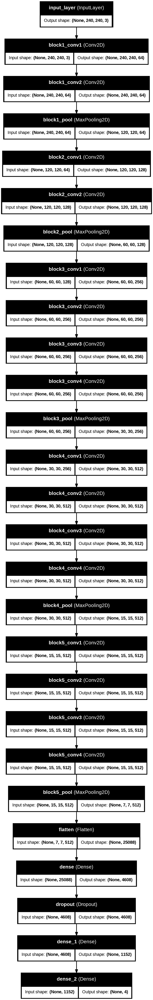

In [ ]:
 plot_model(model_01, show_shapes=True, show_layer_names=True)

In [ ]:
history_01 = model_01.fit(train_generator, steps_per_epoch=10, epochs = 30, callbacks=[es,cp,lrr], validation_data=valid_generator)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 637ms/step - accuracy: 0.2236 - loss: 1.6162
Epoch 1: val_loss improved from inf to 1.41429, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_1.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 58s 4s/step - accuracy: 0.2246 - loss: 1.6085 - val_accuracy: 0.2906 - val_loss: 1.4143 - learning_rate: 1.0000e-04
Epoch 2/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2905 - loss: 1.3926
Epoch 2: val_loss improved from 1.41429 to 1.38158, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_1.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 40s 4s/step - accuracy: 0.2886 - loss: 1.3956 - val_accuracy: 0.3094 - val_loss: 1.3816 - learning_rate: 1.0000e-04
Epoch 3/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 576ms/step - accuracy: 0.3250 - loss: 1.4061
Epoch 3: val_loss did not improve from 1.38158
10/10 ━━━━━━━━━━━━━━━━━━━━ 26s 3s/step - accuracy: 0.3256 - loss: 1.4073 - val_accuracy: 0.3170 - val_loss: 1.3817 - learning_rate: 1.0000e-04
Epoch 4/30
 9/10 ━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 4: val_loss improved from 1.38158 to 1.36777, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_1.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - accuracy: 0.2629 - loss: 1.4364 - val_accuracy: 0.3472 - val_loss: 1.3678 - learning_rate: 1.0000e-04
Epoch 5/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 804ms/step - accuracy: 0.2856 - loss: 1.3957
Epoch 5: val_loss improved from 1.36777 to 1.36525, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_1.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.2861 - loss: 1.3961 - val_accuracy: 0.2868 - val_loss: 1.3652 - learning_rate: 1.0000e-04
Epoch 6/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 620ms/step - accuracy: 0.3185 - loss: 1.3738
Epoch 6: val_loss improved from 1.36525 to 1.34690, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_1.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 25s 3s/step - accuracy: 0.3190 - loss: 1.3743 - val_accuracy: 0.3547 - val_loss: 1.3469 - learning_rate: 1.0000e-04
Epoch 7/30
10/10 ━━━━━━━━━

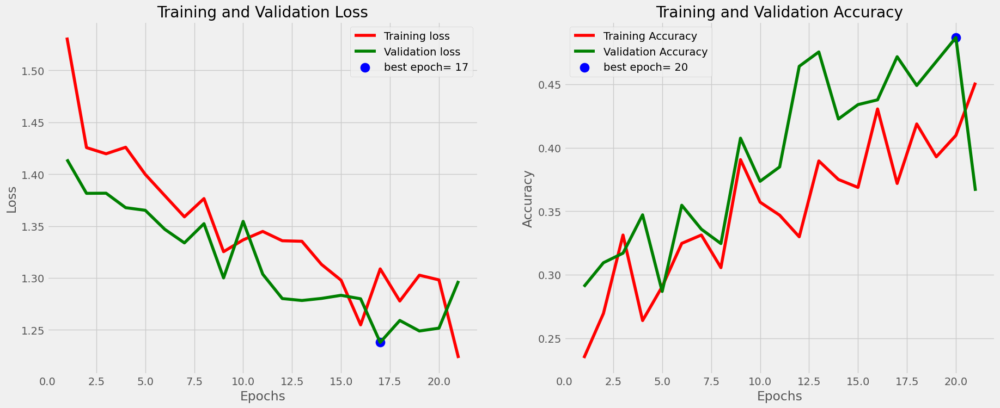

In [ ]:
learning_curves_plot(history_01, start_epoch=0)

### Second Trial: VGG19

In [ ]:
base_model = VGG19(input_shape=(240, 240, 3), include_top=False, weights="imagenet")

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = base_model.output
flat = Flatten()(x)

# class_1=Dense(4608,activation='relu')(flat)
# drop_out=Dropout(0.2)(class_1)
# class_2=Dense(1152,activation='relu')(drop_out)
# output=Dense(4,activation='softmax')(class_2)

# Fully connected layers
fc1 = Dense(1024, activation='relu')(flat)
dropout1 = Dropout(0.5)(fc1)  # Dropout
fc2 = Dense(512, activation='relu')(dropout1)
dropout2 = Dropout(0.5)(fc2)  # Another dropout layer
output = Dense(4, activation='softmax')(dropout2)  # Output layer for 4 classes

# Create the model
model_02 = Model(inputs=base_model.input, outputs=output)

# Print the model summary
model_02.summary()

# Compile the model
model_02.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Define callbacks
filepath = '/content/drive/MyDrive/Brain Tumor/Models/model_2.keras'
es = EarlyStopping(monitor='val_loss', mode='min', patience=4, verbose=1)
cp = ModelCheckpoint(filepath, monitor='val_loss', mode='min', save_best_only=True, verbose=1)
lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, factor=0.5, min_lr=0.00001, verbose=1)



Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 240, 240, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 240, 240, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 120, 120, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 120, 120, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 120, 120, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 60, 60, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 60, 60, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 30, 30, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 30, 30, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 46,242,372 (176.40 MB)

 Trainable params: 26,217,988 (100.01 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

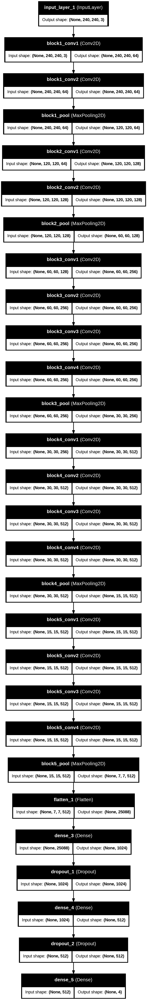

In [ ]:
 plot_model(model_02, show_shapes=True, show_layer_names=True)

In [ ]:
history_02 = model_02.fit(
    train_generator,
    steps_per_epoch=10 ,
    validation_data=valid_generator,
    validation_steps=valid_generator.samples,
    epochs=30,
    callbacks=[es, cp, lrr]
)

Epoch 1/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.2934 - loss: 1.9484
Epoch 1: val_loss improved from inf to 1.43823, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_2.keras


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


10/10 ━━━━━━━━━━━━━━━━━━━━ 28s 2s/step - accuracy: 0.2918 - loss: 1.9472 - val_accuracy: 0.2755 - val_loss: 1.4382 - learning_rate: 1.0000e-04
Epoch 2/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 629ms/step - accuracy: 0.2789 - loss: 1.8400
Epoch 2: val_loss improved from 1.43823 to 1.36136, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_2.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.2791 - loss: 1.8347 - val_accuracy: 0.3019 - val_loss: 1.3614 - learning_rate: 1.0000e-04
Epoch 3/30
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step - accuracy: 0.3078 - loss: 1.8294
Epoch 3: val_loss improved from 1.36136 to 1.34665, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_2.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - accuracy: 0.3062 - loss: 1.8268 - val_accuracy: 0.3170 - val_loss: 1.3467 - learning_rate: 1.0000e-04
Epoch 4/30
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.3078 - loss: 1.6063
Epoch 4: val_loss did not improve from 1.34665
10/10 ━━━━━━━━━━━━

**ADAM OPTIMIZER**

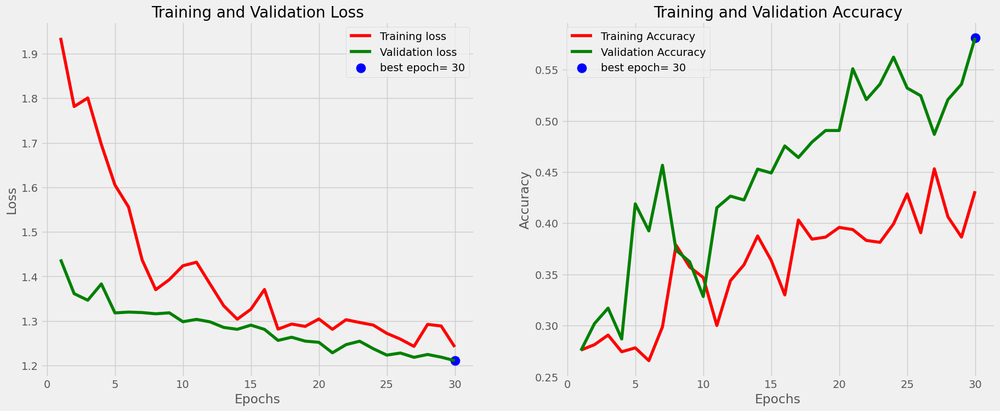

In [ ]:
learning_curves_plot(history_02, start_epoch=0)

### third trial: VGG19

In [ ]:
base_model = VGG19(input_shape=(240, 240, 3), include_top=False, weights="imagenet")

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

# Add custom classification layers
x = base_model.output
flat = Flatten()(x)

class_1=Dense(4608,activation='relu')(flat)
drop_out=Dropout(0.2)(class_1)
class_2=Dense(1152,activation='relu')(drop_out)
output=Dense(4,activation='softmax')(class_2)


model_03 = Model(inputs=base_model.input, outputs=output)
# Print the model summary
model_03.summary()


# Define callbacks
filepath = '/content/drive/MyDrive/Brain Tumor/Models/model_3.keras'
es = EarlyStopping(monitor='val_loss', mode='min', patience=4, verbose=1)
cp = ModelCheckpoint(filepath, monitor='val_loss', mode='min', save_best_only=True, verbose=1)
lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, factor=0.5, min_lr=0.00001, verbose=1)

model_03.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 240, 240, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 240, 240, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 240, 240, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 120, 120, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 120, 120, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 120, 120, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 60, 60, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 60, 60, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 60, 60, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 30, 30, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 30, 30, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 30, 30, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 15, 15, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 15, 15, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 140,948,676 (537.68 MB)

 Trainable params: 120,924,292 (461.29 MB)

 Non-trainable params: 20,024,384 (76.39 MB)

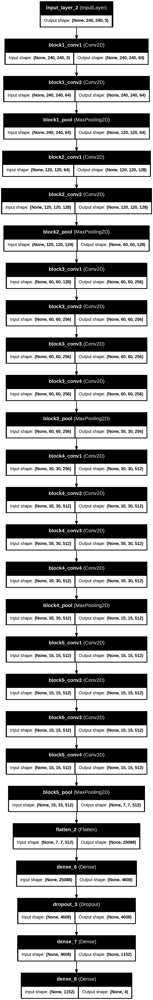

In [ ]:
plot_model(model_03, show_shapes=True, show_layer_names=True)

In [ ]:
# GLOBAL VARIABLES
train_datagen = ImageDataGenerator(
    rescale = 1./255,
                  horizontal_flip=0.4,
                  vertical_flip=0.4,
                  rotation_range=40,
                  shear_range=0.2,
                  width_shift_range=0.4,
                  height_shift_range=0.4,
                  fill_mode='nearest')

test_data_gen = ImageDataGenerator(rescale=1.0/255)
valid_data_gen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/train/',
    batch_size=32,
    target_size=(240,240),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

test_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/test/',
    batch_size=32, target_size=(240,240),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

valid_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/Brain Tumor/Dataset/valid/',
                                                    batch_size=32, target_size=(240,240),
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

Found 1236 images belonging to 4 classes.
Found 264 images belonging to 4 classes.
Found 265 images belonging to 4 classes.


In [ ]:
history3 = model_03.fit(
    train_generator,
    steps_per_epoch=10 ,
    validation_data=valid_generator,
    validation_steps=valid_generator.samples,
    epochs=40,
    callbacks=[es, cp, lrr]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 808ms/step - accuracy: 0.4030 - loss: 1.3547
Epoch 1: val_loss improved from 1.82529 to 1.38868, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_3.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 36s 4s/step - accuracy: 0.4015 - loss: 1.3549 - val_accuracy: 0.3208 - val_loss: 1.3887 - learning_rate: 1.0000e-04
Epoch 2/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 672ms/step - accuracy: 0.3192 - loss: 1.3442
Epoch 2: val_loss improved from 1.38868 to 1.33903, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_3.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 43s 5s/step - accuracy: 0.3283 - loss: 1.3374 - val_accuracy: 0.3962 - val_loss: 1.3390 - learning_rate: 1.0000e-04
Epoch 3/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - accuracy: 0.4016 - loss: 1.3016
Epoch 3: val_loss improved from 1.33903 to 1.32874, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_3.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 51s 6s/step - accuracy: 0.4001 - loss: 1.3012 - val_accur

**Adam optimizer with first model structure(more complex classification layer)**

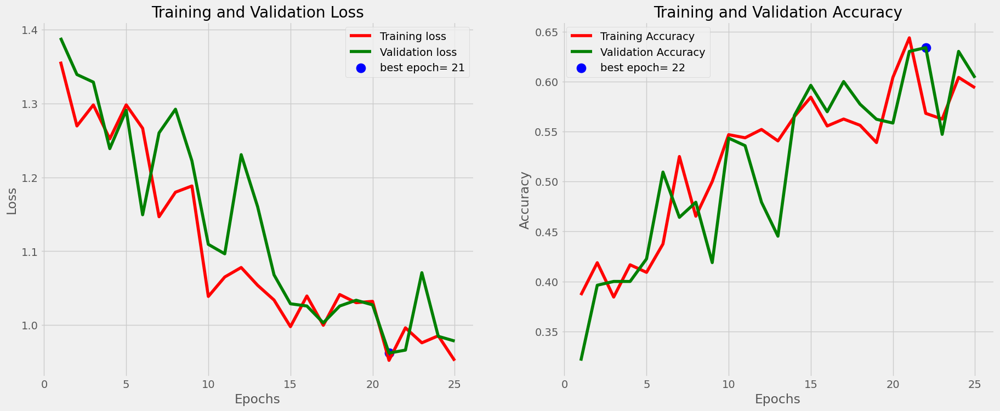

In [ ]:
learning_curves_plot(history3, start_epoch=0)

In [ ]:
# Save the history object to a file
with open("/content/drive/MyDrive/Brain Tumor/histories/history_01.pkl", "wb") as file:
    pickle.dump(history_01, file)
with open("/content/drive/MyDrive/Brain Tumor/histories/history_02.pkl", "wb") as file:
    pickle.dump(history_02, file)
with open("/content/drive/MyDrive/Brain Tumor/histories/history3.pkl", "wb") as file:
    pickle.dump(history3, file)


### FOURTH TRIAL VGG19

In [ ]:
# from tensorflow.keras.optimizers.schedules import ExponentialDecay

base_model = VGG19(input_shape=(224, 224, 3), include_top=False, weights="imagenet")

# Freeze the base model layers
for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-4:]:  # Unfreeze last 4 layers
    layer.trainable = True

x = base_model.output
flat = Flatten()(x)

fc1 = Dense(1024, activation='relu')(flat)
dropout1 = Dropout(0.5)(fc1)  # Dropout
fc2 = Dense(512, activation='relu')(dropout1)
dropout2 = Dropout(0.5)(fc2)  # Another dropout layer
output = Dense(4, activation='softmax')(dropout2)  # Output layer for 4 classes


# Create the model
model_04 = Model(inputs=base_model.input, outputs=output)

# Print the model summary
model_04.summary()


model_04.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Define callbacks
filepath = '/content/drive/MyDrive/Brain Tumor/Models/model_4.keras'
es = EarlyStopping(monitor='val_loss', mode='min', patience=4, verbose=1)
cp = ModelCheckpoint(filepath, monitor='val_loss', mode='min', save_best_only=True, verbose=1)
lrr = ReduceLROnPlateau(monitor='val_accuracy', patience=3, factor=0.5, min_lr=0.0001, verbose=1)



Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv4 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv4 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv4 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 46,242,372 (176.40 MB)

 Trainable params: 33,297,412 (127.02 MB)

 Non-trainable params: 12,944,960 (49.38 MB)

In [ ]:
# GLOBAL VARIABLES
train_datagen = ImageDataGenerator(
    rescale = 1./255,
                  horizontal_flip=0.4,
                  vertical_flip=0.4,
                  rotation_range=40,
                  shear_range=0.2,
                  width_shift_range=0.4,
                  height_shift_range=0.4,
                  fill_mode='nearest')

test_data_gen = ImageDataGenerator(rescale=1.0/255)
valid_data_gen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/train/',
    batch_size=32,
    target_size=(224,224),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

test_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/test/',
    batch_size=32, target_size=(224,224),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

valid_generator = train_datagen.flow_from_directory('/content/drive/MyDrive/Brain Tumor/Dataset/valid/',
                                                    batch_size=32, target_size=(224,224),
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed = 42,
                                                    color_mode = 'rgb')

Found 1236 images belonging to 4 classes.
Found 264 images belonging to 4 classes.
Found 265 images belonging to 4 classes.


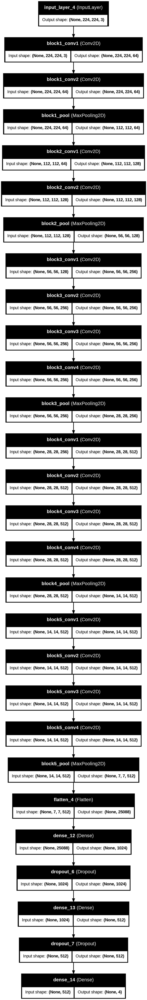

In [ ]:
plot_model(model_04, show_shapes=True, show_layer_names=True)

In [ ]:

history_04 = model_04.fit(
    train_generator,
    steps_per_epoch=10 ,
    validation_data=valid_generator,
    validation_steps=valid_generator.samples,
    epochs=40,
    callbacks=[es, cp, lrr]
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.2817 - loss: 1.8313
Epoch 1: val_loss improved from inf to 1.44099, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_4.keras


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


10/10 ━━━━━━━━━━━━━━━━━━━━ 59s 4s/step - accuracy: 0.2800 - loss: 1.8216 - val_accuracy: 0.2528 - val_loss: 1.4410 - learning_rate: 1.0000e-04
Epoch 2/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step - accuracy: 0.2436 - loss: 1.5810
Epoch 2: val_loss improved from 1.44099 to 1.42417, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_4.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 18s 2s/step - accuracy: 0.2459 - loss: 1.5761 - val_accuracy: 0.2528 - val_loss: 1.4242 - learning_rate: 1.0000e-04
Epoch 3/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step - accuracy: 0.2072 - loss: 1.5227
Epoch 3: val_loss improved from 1.42417 to 1.38920, saving model to /content/drive/MyDrive/Brain Tumor/Models/model_4.keras
10/10 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.2094 - loss: 1.5182 - val_accuracy: 0.2943 - val_loss: 1.3892 - learning_rate: 1.0000e-04
Epoch 4/40
 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 270ms/step - accuracy: 0.2533 - loss: 1.4340
Epoch 4: val_loss improved from 1.38920 to 1.37764, saving model 

In [ ]:
with open("/content/drive/MyDrive/Brain Tumor/histories/history_04.pkl", "wb") as file:
    pickle.dump(history_04, file)

**224x224x3 instead of 240x240x3**

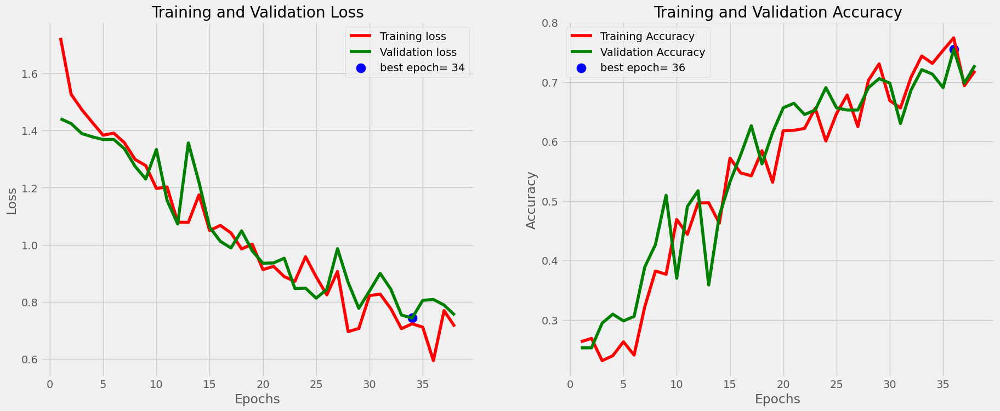

In [ ]:
learning_curves_plot(history_04, start_epoch=0)

## CUSTOM MODEL INSPIRED BY ON VGG19

In [ ]:
# GLOBAL VARIABLES
batch_size=16
image_shape = (224, 224)

# Define ImageDataGenerators with augmentation for the training set
train_datagen = ImageDataGenerator(
    rescale=1./255,
    # Rescale pixel values to [0,1]
#     rotation_range=20,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     shear_range=0.1,
#     zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Validation and test generators should not have augmentation, just rescaling
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load images from directories
train_generator = train_datagen.flow_from_directory(
    './drive/MyDrive/Brain Tumor/Dataset/train/',
    color_mode="grayscale",
    target_size=image_shape,
    batch_size=batch_size,
)

validation_generator = val_datagen.flow_from_directory(
    './drive/MyDrive/Brain Tumor/Dataset/valid/',
    color_mode="grayscale",
    target_size=image_shape,
    batch_size=batch_size,
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    './drive/MyDrive/Brain Tumor/Dataset/test/',
    color_mode="grayscale",
    target_size=image_shape,
    batch_size=batch_size,
    shuffle=False
)

Found 1236 images belonging to 4 classes.
Found 265 images belonging to 4 classes.
Found 264 images belonging to 4 classes.


In [ ]:
# Count images for each split
train_counts = count_images_in_directory(r'/content/drive/MyDrive/Brain Tumor/Dataset/train')
val_counts = count_images_in_directory(r'/content/drive/MyDrive/Brain Tumor/Dataset/valid')
test_counts = count_images_in_directory(r'/content/drive/MyDrive/Brain Tumor/Dataset/test')

# Print the counts
print("Training Set Counts:")
print(train_counts)
print("\nValidation Set Counts:")
print(val_counts)
print("\nTest Set Counts:")
print(test_counts)

Training Set Counts:
{'G': 312, 'P': 292, 'N': 314, 'M': 318}

Validation Set Counts:
{'G': 67, 'P': 63, 'N': 67, 'M': 68}

Test Set Counts:
{'G': 67, 'P': 62, 'N': 67, 'M': 68}


In [ ]:
# GLOBAL VARIABLES
class_names = [class_name for class_name in os.listdir(r'/content/drive/MyDrive/Brain Tumor/Dataset/train')]
class_names

['G', 'P', 'N', 'M']

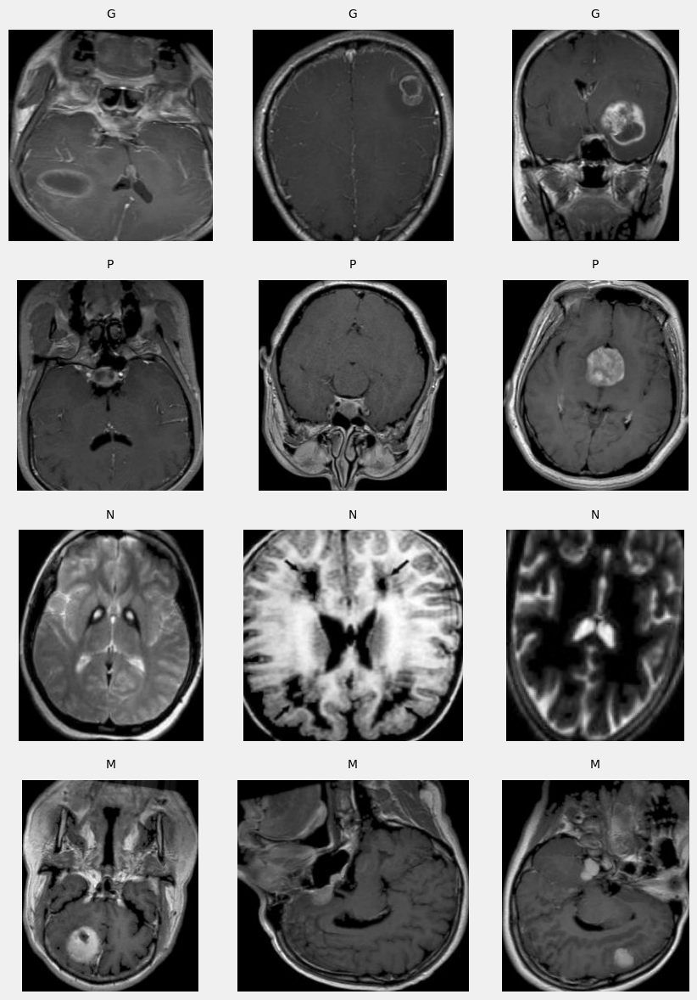

In [ ]:
show_samples(r'/content/drive/MyDrive/Brain Tumor/Dataset/train', class_names, num_samples=3)

### Building the model layers

In [ ]:
MODEL=Sequential?

In [ ]:
# input_shape = (224, 224, 3) # RGB
# input_shape = (224, 224, 1) # Gray Scale
input_shape = (240, 240, 1) # Gray Scale
num_classes = 4
model_custom_01 = Sequential()

model_custom_01.add(Input(shape=input_shape))
model_custom_01.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model_custom_01.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model_custom_01.add(BatchNormalization())
model_custom_01.add(MaxPooling2D(pool_size=(2,2)))

model_custom_01.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model_custom_01.add(Conv2D(128, (3, 3), activation='relu', padding="same"))
model_custom_01.add(BatchNormalization())
model_custom_01.add(MaxPooling2D(pool_size=(2,2)))

model_custom_01.add(Conv2D(64, (5, 5), activation='relu', padding="same"))
model_custom_01.add(Conv2D(64, (5, 5), activation='relu', padding="same"))
model_custom_01.add(BatchNormalization())
model_custom_01.add(MaxPooling2D(pool_size=(2,2)))

model_custom_01.add(Conv2D(64, (5, 5), activation='relu', padding="same"))
model_custom_01.add(Conv2D(64, (5, 5), activation='relu', padding="same"))
model_custom_01.add(BatchNormalization())
model_custom_01.add(MaxPooling2D(pool_size=(2,2)))

model_custom_01.add(Conv2D(32, (5, 5), activation='relu', padding="same"))
model_custom_01.add(Conv2D(32, (5, 5), activation='relu', padding="same"))
model_custom_01.add(BatchNormalization())
model_custom_01.add(MaxPooling2D(pool_size=(2,2)))

# Fully connected layers
model_custom_01.add(Flatten())
model_custom_01.add(Dense(256, activation='relu'))
model_custom_01.add(BatchNormalization())
model_custom_01.add(Dense(128, activation='relu'))
model_custom_01.add(Dropout(0.3))
model_custom_01.add(Dense(num_classes, activation='softmax'))

# model_custom_01 = Sequential([
#     Input(shape=input_shape),  # ✅ Define input shape here instead of Conv2D

#     Conv2D(128, (3, 3), activation='relu'),
#     Conv2D(128, (3, 3), activation='relu', padding="same"),
#     BatchNormalization(),
#     MaxPooling2D(pool_size=(2,2)),

#     Conv2D(128, (3, 3), activation='relu', padding="same"),
#     Conv2D(128, (3, 3), activation='relu', padding="same"),
#     BatchNormalization(),
#     MaxPooling2D(pool_size=(2,2)),

#     Conv2D(64, (5, 5), activation='relu', padding="same"),
#     Conv2D(64, (5, 5), activation='relu', padding="same"),
#     BatchNormalization(),
#     MaxPooling2D(pool_size=(2,2)),

#     Conv2D(64, (5, 5), activation='relu', padding="same"),
#     Conv2D(64, (5, 5), activation='relu', padding="same"),
#     BatchNormalization(),
#     MaxPooling2D(pool_size=(2,2)),

#     Conv2D(32, (5, 5), activation='relu', padding="same"),
#     Conv2D(32, (5, 5), activation='relu', padding="same"),
#     BatchNormalization(),
#     MaxPooling2D(pool_size=(2,2)),

#     Flatten(),
#     Dense(256, activation='relu'),
#     BatchNormalization(),
#     Dense(128, activation='relu'),
#     Dropout(0.3),
#     Dense(num_classes, activation='softmax')
# ])

In [ ]:
model_custom_01.compile(optimizer=Adam(learning_rate=0.0001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
model_custom_01.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_60 (Conv2D)                   │ (None, 240, 240, 128)       │           1,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_61 (Conv2D)                   │ (None, 240, 240, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_36               │ (None, 240, 240, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_30 (MaxPooling2D)      │ (None, 120, 120, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_62 (Conv2D)                   │ (None, 120, 120, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_63 (Conv2D)                   │ (None, 120, 120, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_37               │ (None, 120, 120, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_31 (MaxPooling2D)      │ (None, 60, 60, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_64 (Conv2D)                   │ (None, 60, 60, 64)          │         204,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_65 (Conv2D)                   │ (None, 60, 60, 64)          │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_38               │ (None, 60, 60, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_32 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_66 (Conv2D)                   │ (None, 30, 30, 64)          │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_67 (Conv2D)                   │ (None, 30, 30, 64)          │         102,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_39               │ (None, 30, 30, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_33 (MaxPooling2D)      │ (None, 15, 15, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_68 (Conv2D)                   │ (None, 15, 15, 32)          │          51,232 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_69 (Conv2D)                   │ (None, 15, 15, 32)          │          25,632 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_40               │ (None, 15, 15, 32)          │             128 │
│ (BatchNormalization)                 │                             │              

 Total params: 1,470,916 (5.61 MB)

 Trainable params: 1,469,572 (5.61 MB)

 Non-trainable params: 1,344 (5.25 KB)

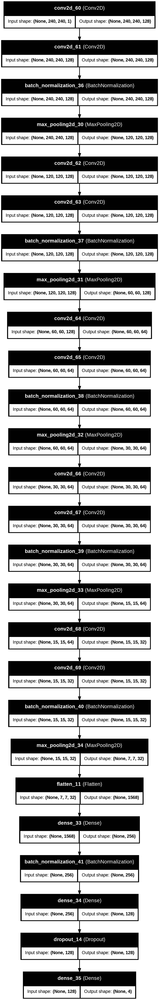

In [ ]:
 plot_model(model_custom_01, show_shapes=True, show_layer_names=True)

In [ ]:
# GLOBAL VARIABLES
early_stopping = EarlyStopping(monitor='val_loss',
                               mode='min',
                               patience=4,
                               restore_best_weights=True,
                               verbose=1
                               )

# reduce_lr = ReduceLROnPlateau(monitor='val_loss',
#                               factor=0.3,
#                               verbose=1,
#                               patience=2,
#                               min_lr=1e-10)
reduce_lr = ReduceLROnPlateau(monitor='val_accuarcy', patience=3, verbose=1, factor=0.5, min_lr=0.0001)

model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Brain Tumor/Models/model_custom_01.keras',
                                   monitor='val_loss',
                                   save_best_only=True,
                                   save_weights_only=False,
                                   mode='auto',
                                   save_freq='epoch')

callbacks = [early_stopping, reduce_lr, model_checkpoint]


In [ ]:
history_custom_01 = model_custom_01.fit(
    train_generator,
    epochs=40,
    steps_per_epoch=10,
    # batch_size=10,
    validation_data=validation_generator,
    callbacks=callbacks,
)

Epoch 1/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.3809 - loss: 1.3517

/usr/local/lib/python3.11/dist-packages/keras/src/callbacks/callback_list.py:145: UserWarning: Learning rate reduction is conditioned on metric `val_accuarcy` which is not available. Available metrics are: accuracy,loss,val_accuracy,val_loss,learning_rate.
  callback.on_epoch_end(epoch, logs)


10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 668ms/step - accuracy: 0.3826 - loss: 1.3480 - val_accuracy: 0.2943 - val_loss: 1.3783 - learning_rate: 1.0000e-04
Epoch 2/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 8s 891ms/step - accuracy: 0.4906 - loss: 1.2187 - val_accuracy: 0.3547 - val_loss: 1.3576 - learning_rate: 1.0000e-04
Epoch 3/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 503ms/step - accuracy: 0.4738 - loss: 1.3341 - val_accuracy: 0.2000 - val_loss: 1.4494 - learning_rate: 1.0000e-04
Epoch 4/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 366ms/step - accuracy: 0.5498 - loss: 1.1229 - val_accuracy: 0.1509 - val_loss: 1.4645 - learning_rate: 1.0000e-04
Epoch 5/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 369ms/step - accuracy: 0.4790 - loss: 1.3863 - val_accuracy: 0.1547 - val_loss: 1.4694 - learning_rate: 1.0000e-04
Epoch 6/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 503ms/step - accuracy: 0.5455 - loss: 1.0647 - val_accuracy: 0.1472 - val_loss: 1.4380 - learning_rate: 1.0000e-04
Epoch 6: early stopping
Restoring model weights from the end of the best e

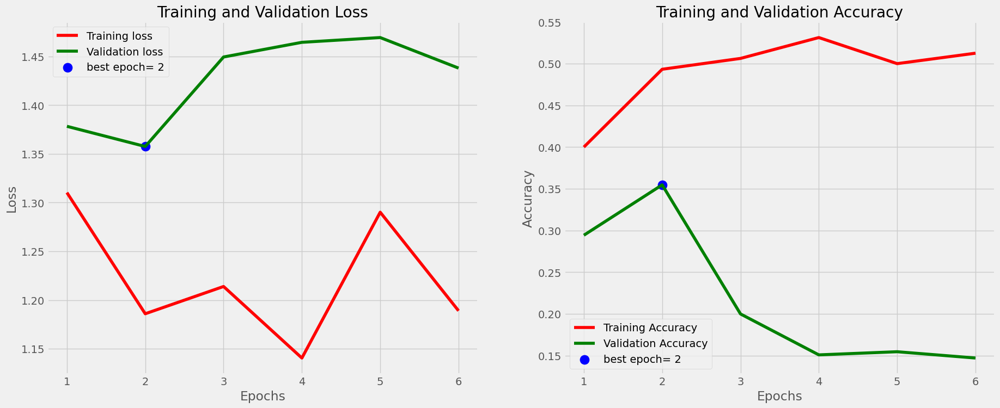

In [ ]:
learning_curves_plot(history_custom_01, start_epoch=0)

### BEST MODEL

In [ ]:
test_generator = train_datagen.flow_from_directory(
    '/content/drive/MyDrive/Brain Tumor/Dataset/test/',
    batch_size=32, target_size=(224,224),
    class_mode='categorical',
    shuffle=True,
    seed = 42,
    color_mode = 'rgb')

Found 264 images belonging to 4 classes.


In [ ]:
best_model = load_model("/content/drive/MyDrive/Brain Tumor/Models/model_4.keras")
# Evaluate on test data
test_loss, test_acc = best_model.evaluate(test_generator)
print(f"test loss: {test_loss}")
print(f"test accuracy: {test_acc}")

# Get predictions
y_pred = best_model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)

# Get true labels
y_true = test_generator.classes

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


9/9 ━━━━━━━━━━━━━━━━━━━━ 9s 820ms/step - accuracy: 0.6860 - loss: 0.7053
test loss: 0.7145156860351562
test accuracy: 0.7007575631141663
9/9 ━━━━━━━━━━━━━━━━━━━━ 4s 312ms/step


In [ ]:
print(classification_report(y_true, y_pred_classes, target_names=class_names))

              precision    recall  f1-score   support

           G       0.22      0.28      0.25        67
           P       0.36      0.24      0.29        68
           N       0.27      0.25      0.26        67
           M       0.25      0.29      0.27        62

    accuracy                           0.27       264
   macro avg       0.28      0.27      0.27       264
weighted avg       0.28      0.27      0.27       264



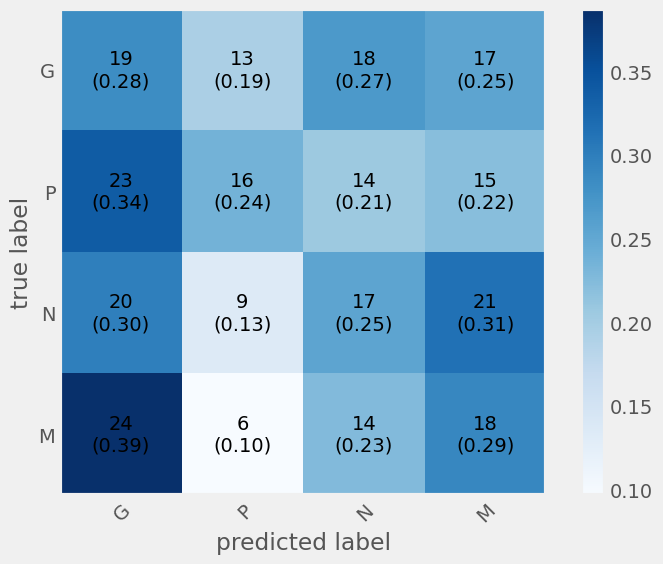

In [ ]:
# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

plot_confusion_matrix(conf_matrix,
                      class_names=class_names,
                      show_normed=True,
                      figsize=(8,6),
                      colorbar=True)

plt.show();

## NASNET MODEL

In [ ]:
# GLOBAL VARIABLES
train_dataset = image_dataset_from_directory("./drive/MyDrive/Brain Tumor/Dataset/train",
                                             batch_size=8,
                                             image_size=(224, 224))

validation_dataset = image_dataset_from_directory("./drive/MyDrive/Brain Tumor/Dataset/valid",
                                             batch_size=8,
                                             image_size=(224, 224))

test_dataset = image_dataset_from_directory("./drive/MyDrive/Brain Tumor/Dataset/test",
                                             batch_size=8,
                                             image_size=(224, 224))

class_names = train_dataset.class_names
class_names

In [ ]:
preprocess_input = tf.keras.applications.nasnet.preprocess_input

In [ ]:
nasnet = nasnet_model(data_augmenter())

In [ ]:
# Compile the model
nasnet.compile(optimizer=Adam(learning_rate=0.001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Model summary
nasnet.summary()

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
# GLOBAL VARIABLE
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=8,
                               restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                              factor=0.3,
                              verbose=1,
                              patience=2,
                              min_lr=1e-10)

model_checkpoint = ModelCheckpoint('/content/drive/MyDrive/Brain Tumor/Models/nasnet_model.keras',
                                   monitor='val_loss',
                                   save_best_only=True)

callbacks = [early_stopping, reduce_lr, model_checkpoint]

In [ ]:
nasnet_history = nasnet.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=30,
    callbacks=callbacks,
    # batch_size=8
    steps_per_epoch=10,
)

In [ ]:
learning_curves_tuning(nasnet_history, start_epoch=0)

## FINE TUNING

In [ ]:
# GLOBAL VARIABLES
# Unfreezing the base model for fine-tuning
base_model = nasnet.layers[2]  # Assume 'nasnet.layers[2]' is correct for your architecture
base_model.trainable = True

# Display the number of layers in the base model
print("Number of layers in the base model:", len(base_model.layers))

# Set the layer from which to start fine-tuning
fine_tune_at = 35

# Freeze all layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Recompile the model after modifying the trainable layers
nasnet.compile(
    loss="sparse_categorical_crossentropy",
    optimizer=Adam(learning_rate=0.0001),
    metrics=["accuracy"]
)

# Define the callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=8,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.3,
    verbose=1,
    patience=2,
    min_lr=1e-10
)

model_checkpoint = ModelCheckpoint(
    filepath=('/content/drive/MyDrive/Brain Tumor/Models/nasnet_model.keras',
    monitor="val_loss",
    save_best_only=True
)

In [ ]:
# GLOBAL VARIABLE
callbacks = [early_stopping, reduce_lr, model_checkpoint]

# Set fine-tuning epochs
fine_tune_epochs = 25
initial_epochs = len(nasnet_history.epoch) if 'nasnet_history' in locals() else 0
total_epochs = initial_epochs + fine_tune_epochs

# Perform fine-tuning
history_fine = nasnet.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=total_epochs,
    initial_epoch=initial_epochs,
    steps_per_epoch=10,  # Adjust this based on dataset size
    callbacks=callbacks
)

# Print summary of fine-tuning process
print(f"Fine-tuning completed. Total epochs: {total_epochs}")

In [ ]:
# print("Callback logs before training:", callbacks)


In [ ]:
learning_curves_tuning(nasnet_history, start_epoch=0, history_fine=history_fine, fine_tune_epoch=31)

In [ ]:
# Evaluate on test data
test_loss, test_acc = nasnet.evaluate(test_dataset)
print(f"test loss: {test_loss}")
print(f"test accuracy: {test_acc}")

In [ ]:
predicted_labels = []
true_labels = []

for images, labels in test_dataset:
    predictions = nasnet.predict(images)
    predicted_labels.extend(np.argmax(predictions, axis=1))
    true_labels.extend(labels)

# Convert true labels to numpy array
true_labels = np.array(true_labels)

In [ ]:
print(classification_report(true_labels, predicted_labels, target_names=class_names))

### CONFUSION MATRIX

In [ ]:
# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

plot_confusion_matrix(conf_matrix,
                      class_names=class_names,
                      show_normed=True,
                      figsize=(8,6),
                      colorbar=True)

plt.show();
